In [1]:
#Loading Packages
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(GGally)
library(AER)
library(gridExtra)
library(caret)
library(pROC)
library(boot)
library(ggplot2)
library(leaps)
library(MASS)
library(glmnet)
options(warn=-1)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: car

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: lmtest

Loading required package: zoo


A

In This data exploration, we will be looking at a Diabetes dataset. This data is from the United States National Institute of Diabetes and Digestive and Kidney Diseases. The data is drawn entirely from females over the age of 21 of Pima Indian descent and has 768 entries. The data consists of 8 biological measurments and a binary factor indicating if they have diabetes. The measurements/ variables are:

| Variable          |    Meaning                                                    |
| ----------------- |    :----------------------------------------------------------: |
|**Pregnancies**    |  Number of pregnancies                                       |
| **Glucose**       |  Number to express glucose level in the blood                |
| **BloodPressure** |  Number to express blood pressure level                      |
| **SkinThickness** |  Number to express skin thickness                            |
| **Insulin**       |  Number to express insulin level in the blood                |
| **BMI**           |  Body Mass Index Number                                      |
|**DiabetesPedigreeFunction**| probability of diabetes based on family history|
|**Age**            |  Age in years at time of measurment                          |
|**Outcome**        |  Whether or not the patient has diabetes(1 for yes, 0 for no)|

Diabetes Pedigree Function is a number inbewteen 0 and 1, Pregnancies and glucose age are positive integer values, and the rest of the variables are discrete continuous variables.

In [2]:
#reading loading in The Data
diabetes_data <- read_csv("diabetes.csv",show_col_types = FALSE)

In [3]:
sorted <- diabetes_data[order(diabetes_data$SkinThickness,decreasing = FALSE),]
# a quick look at the data set
head(sorted)

Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8,183,64,0,0,23.3,0.672,32,1
5,116,74,0,0,25.6,0.201,30,0
10,115,0,0,0,35.3,0.134,29,0
8,125,96,0,0,0.0,0.232,54,1
4,110,92,0,0,37.6,0.191,30,0
10,168,74,0,0,38.0,0.537,34,1


In some of the variables, there is an entry of 0 which does not make sense, and these are in place of missing values. After doing some reasearch, Having a level of 0 in Glucose, Blood Pressure, and BMI, and Skin Thickness does not make sense in the context of how the variables numerically represented. After inspecing the data set, impossible 0 values are randomly distributed, So turning them into "NA" is an appropriate approach to correct this.

In [4]:
#Getting turning 
diabetes_data_w_NA <- diabetes_data %>%
mutate_at(c('Glucose','BloodPressure','BMI','Insulin'), ~na_if(., 0))
num_rows_with_multiple_nas <- sum(apply(diabetes_data_w_NA, 1, function(row) sum(is.na(row)) > 0))

#Check amount of na values                                     
num_rows_with_multiple_nas
sum(diabetes_data$Glucose == 0)
sum(diabetes_data$BloodPressure == 0)
sum(diabetes_data$BMI == 0)
sum(diabetes_data$SkinThickness == 0)
sum(diabetes_data$Insulin == 0)

[1] 376

[1] 5

[1] 35

[1] 11

[1] 227

[1] 374

After looking at the amount of data values replaced, it is quite a lot of observations, So simply removing all of these rows will get rid of too much data, so, I will get rid of Glucose','BloodPressure','BMI', however, since skin thickness has 227 NA Values, after looking at the distibution of the skin thickness values overall, and the distribution of the na values, I will impute them to be the median of skin thickness.

In [5]:
diabetes_data_clean <-diabetes_data_w_NA |>
na.omit()

diabetes_data_clean$Insulin <- ifelse(
  diabetes_data_clean$Insulin == 0,
  median(diabetes_data_clean$Insulin[diabetes_data_clean$Insulin != 0], na.rm = TRUE),
  diabetes_data_clean$Insulin
)

diabetes_data_clean$SkinThickness <- ifelse(
  diabetes_data_clean$SkinThickness == 0,
  median(diabetes_data_clean$SkinThickness[diabetes_data_clean$SkinThickness != 0], na.rm = TRUE),
  diabetes_data_clean$SkinThickness
)
head(diabetes_data_clean)

#check all nas are gone
sum(apply(diabetes_data_clean, 1, function(row) sum(is.na(row)) > 0))

Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,89,66,23,94,28.1,0.167,21,0
0,137,40,35,168,43.1,2.288,33,1
3,78,50,32,88,31.0,0.248,26,1
2,197,70,45,543,30.5,0.158,53,1
1,189,60,23,846,30.1,0.398,59,1
5,166,72,19,175,25.8,0.587,51,1


[1] 0

Now that the data is in a tidy clean format, we will begin with the data exploration

**The Question**:
Given Biometric data on pima indian females over the age of 21, can we accurately predict if person has diabetes using MLR methods?

Now, lets visualize  the distribution / frequency of the different variables. This will help us understand how the different variables are distributed and give us an idea about how our data can begin to be related. For these visualizations I will use the datasets with 0 in them, just for the R visualization

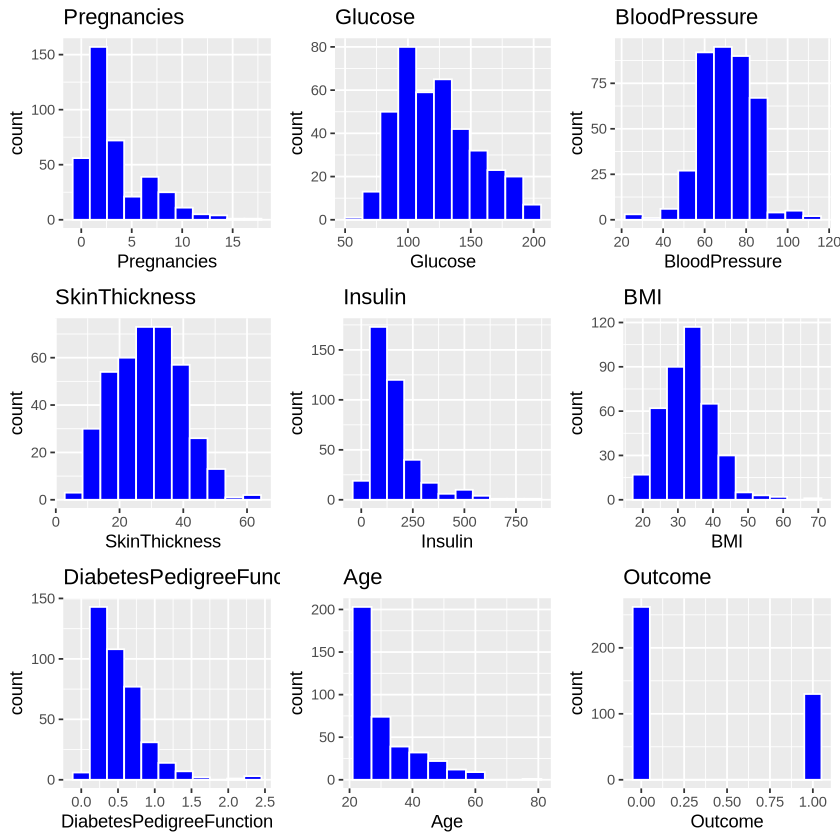

In [6]:


#Visualization 
numeric_cols <- diabetes_data_clean[, sapply(diabetes_data_clean, is.numeric)]
diabetes_histograms <- lapply(names(numeric_cols), function(col) {
  ggplot(numeric_cols, aes_string(x = col)) +
    geom_histogram(binwidth = diff(range(numeric_cols[[col]])) / 10, fill = "blue", color = "white") +
    ggtitle(paste( col))
})


grid.arrange(grobs = diabetes_histograms, ncol = 3)

From the histograms above, we can identify that glucose, blood pressure, and bmi follow a relativly normal distribution, while the rest of the variables follow a left of right skewed dataset. However, Skin thickness seems to follow a strange distribution, so it may cause problems if it is included in the MLR model. We can also see that there are more entries without diabetes than with, which will be interesting to look at.

Now, we can take a look at the correlation between the variables, and the distribution of variables across the diabetes outcome, which may give us an indication of what variables will give us sucsessful predictions. Looking at the box plots will also give us a good idea of the shape of the data and other insights such as the distribution of outliers present in the variables.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


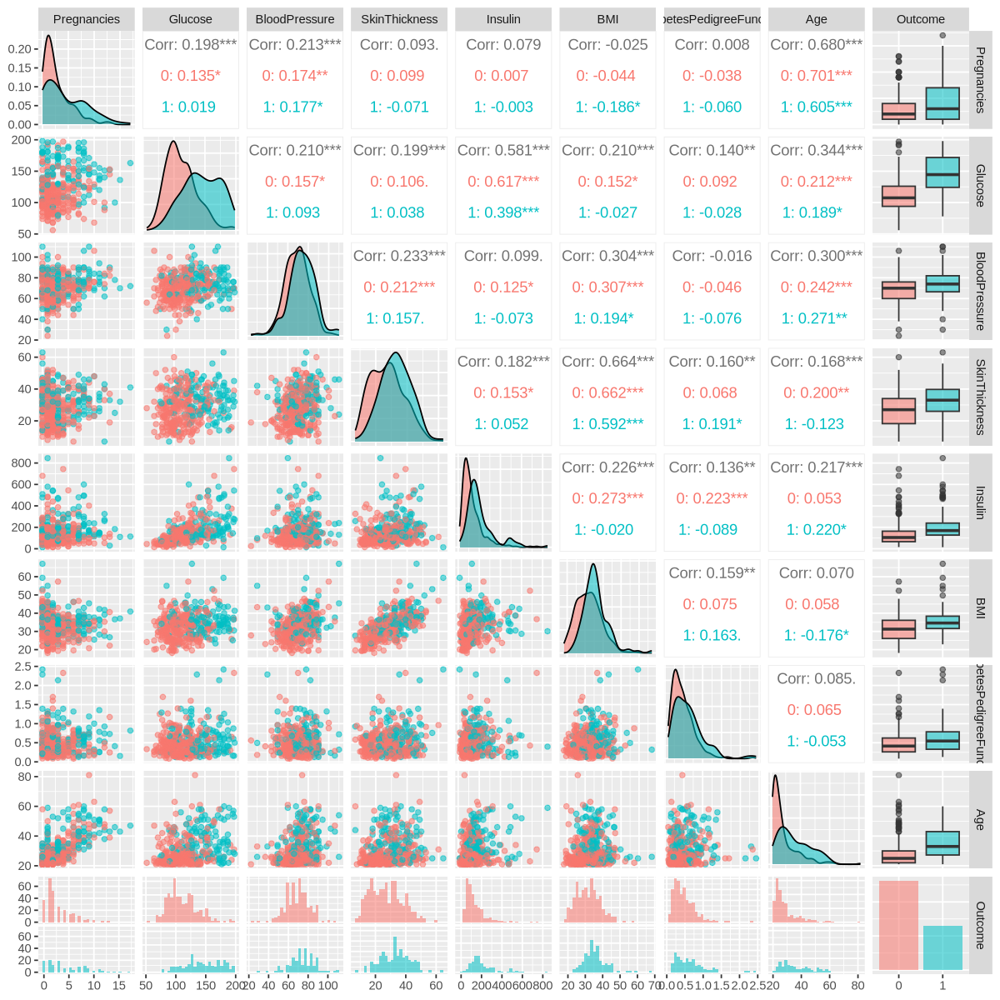

In [7]:
options(repr.plot.width = 10, repr.plot.height = 10) 

#turning into factors
diabetes_data_fact <- diabetes_data_clean %>% 
     mutate(across(where(~is.numeric(.) && 
                           all(unique(.) %in% c(0, 1))),  factor))

#the pair plot
pairplot <- diabetes_data_fact |>
 ggpairs(aes(color = Outcome, alpha = 0.5))


pairplot

From this graph, we can see that regaurdless of outcome, the variables BloodPressure,and Skin Thickness, are very similarily distributed. For the rest of the variables, patients without diabetes seem to have more frequency on the lower numerical value of what ever varbiable, While patients with diabetes seem to have more frequency toward the higher numerical values. For example, pateints without diabetes seem to on average, have lower pregnancies than patients with diabetes, and patients without diabetes seem to on average, have more people that have lower amounts of glucose than patients with diabetes. These variables may be a good indicator of diabetes outcome.

From the boxplots, we can atain that insulin, Pedigree function, age, and glucose have many outliers outside of the inter quartile range. When we do our analysis, we can look into how our MLR reacts to removing these outliers from our data set.

corrplot 0.92 loaded



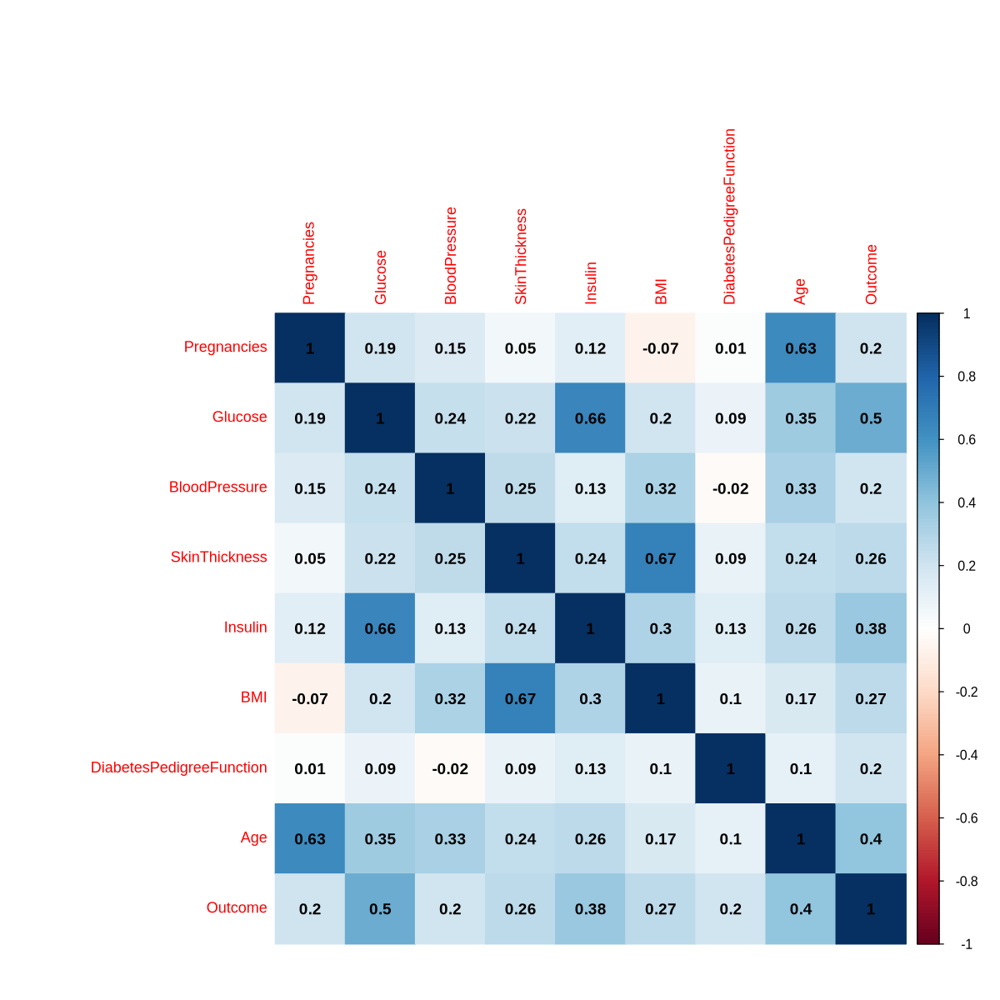

In [8]:
library(corrplot)
#making the correlation matrix
options(repr.plot.width = 10, repr.plot.height = 10) 
correlm<-corrplot(cor(as.matrix(diabetes_data_clean),method = "spearman"),
                 method = "color",
                  tl.cex = 0.9,
                 number.cex = 0.95,
                 addCoef.col = "black")

From this matrix, we can identify some variables that are highley correlated to eachother, such as age and pregnancies. This may give problems to our prediction models, So when we do the data analysis, we will take a look at the VIF scores to see the multico linearity whichwill further give us an insight into what variables may hinder prediction performance. Althoug, the correlations related to outcome have no bearing as it is a binary variable.

Finally, we will look at the standard deveation of the variables.

In [9]:
apply(diabetes_data_clean,2,sd)

Pregnancies                  Glucose            BloodPressure 
               3.2114245               30.8607806               12.4960916 
           SkinThickness                  Insulin                      BMI 
              10.5164239              118.8416898                7.0276592 
DiabetesPedigreeFunction                      Age                  Outcome 
               0.3454880               10.2007765                0.4714014

# Methods And Plan


The Question I will be answering is: Given Biometric data on pima indian females over the age of 21, can we accurately predict if person has diabetes using MLR methods?. I will also be taking a look at which biometric variables are statistically associated with Diabetes.

I beleive the mose appropriate ethod to do this is to use a GLM model with a logistic regression approach, as the thing I am predicting, Diabetes, is a binary outcome variable. This will be the best way to also asses a relationship between the Outcome, Diabetes, and the various biometric predictors.

I beleive this is the best approach because, as stated before, the outcome is a binary factor, and Logistic regression is designed to model the probability of a binary outcome as a function of predictor variables. So this works because the response variable reperesents a classification problem. When we take a glance at the GLM, we will see in the summarry the coefficeints and the p value calculated for each variable in the full model, which will help us establish statistical associaton between the predicter variables and outcome, and logistic regression can handle the mix of continuous variables that are in the Diabetes dataset. I will also use p-values for coefficients, helping identify statistically significant predictors.

The assumptions I am using are:

* Linearity in the Log-Odds: Logistic regression assumes that the relationship between predictors and the log-odds of the outcome is linear.
* Independence of Observations: I assume dataset assumes that observations are independent of each other. This shoudl be  valid as the dataset represents individual patient records.
* No Perfect Multicollinearity: I will assume all of the variables are not perfectly correlated with one and another, and will take a futher look at this using vif numbers to evaluate the multicolinearity on the model.
  
**Model Selection and Evaluation:**
* Data Preprocessing:Handle missing values by imputing or excluding rows/columns with excessive missingness.
Replace biologically implausible values (e.g., 0 in "SkinThickness") with the median.
* Variable Selection:Start I well with a full logistic regression model including all predictors, then
Perform backward selection using AIC to identify the most simple and "best" model while trying to maintain accuracy/ predictive power.
* Model Validation: I will Split the dataset into training (70%) and test (30%) sets, then 
evaluate model performance using metrics such as accuracy, ROC-AUC, sensitivity, and specificity.
* Cross-Validation: I will perform a k fold cross valuation with k= 10 to assess the model’s stability and generalizability.
  
**Potential Limitations or Weaknesses**
* Linearity Assumption: If the predictors do not have a linear relationship with the log-odds, the model might underperform. Polynomial or interaction terms may add complexity.
* Class Imbalance: If one class dominates, the model may be biased. I will use lasso regression to help regulize this


## Implementation of a proposed model ##

For this I will be implementing the method of using a GLM to see if we can accuratly predict diabetes

In [10]:
#Assesssing multycolinearity
FULL_GLM <- glm(Outcome~.,
                data = diabetes_data_clean,
               family = binomial)
vif(FULL_GLM)

Pregnancies                  Glucose            BloodPressure 
                1.892387                 1.378937                 1.191287 
           SkinThickness                  Insulin                      BMI 
                1.638865                 1.384038                 1.832416 
DiabetesPedigreeFunction                      Age 
                1.031715                 1.974053

Since None of the variable have a VIF Vale that indicated a problem(<5) we are good to go.

In [11]:
#Making testing And training Data
training_diabetes  = diabetes_data_clean %>%
  sample_frac(0.7)

testing_diabetes = diabetes_data_clean %>%
  setdiff(training_diabetes)


In [12]:
set.seed(2)


# Fitting the model on training data
Diabetes_train_full <- glm(Outcome ~ .,
                           data = training_diabetes, family = binomial)

# Predict on test data
predicted_vals <- predict(Diabetes_train_full, newdata = testing_diabetes, type = "response")
# "rounding" predicted values to binary output
fitted_values <- ifelse(predicted_vals > 0.5, 1, 0)



[1] 0.7457627

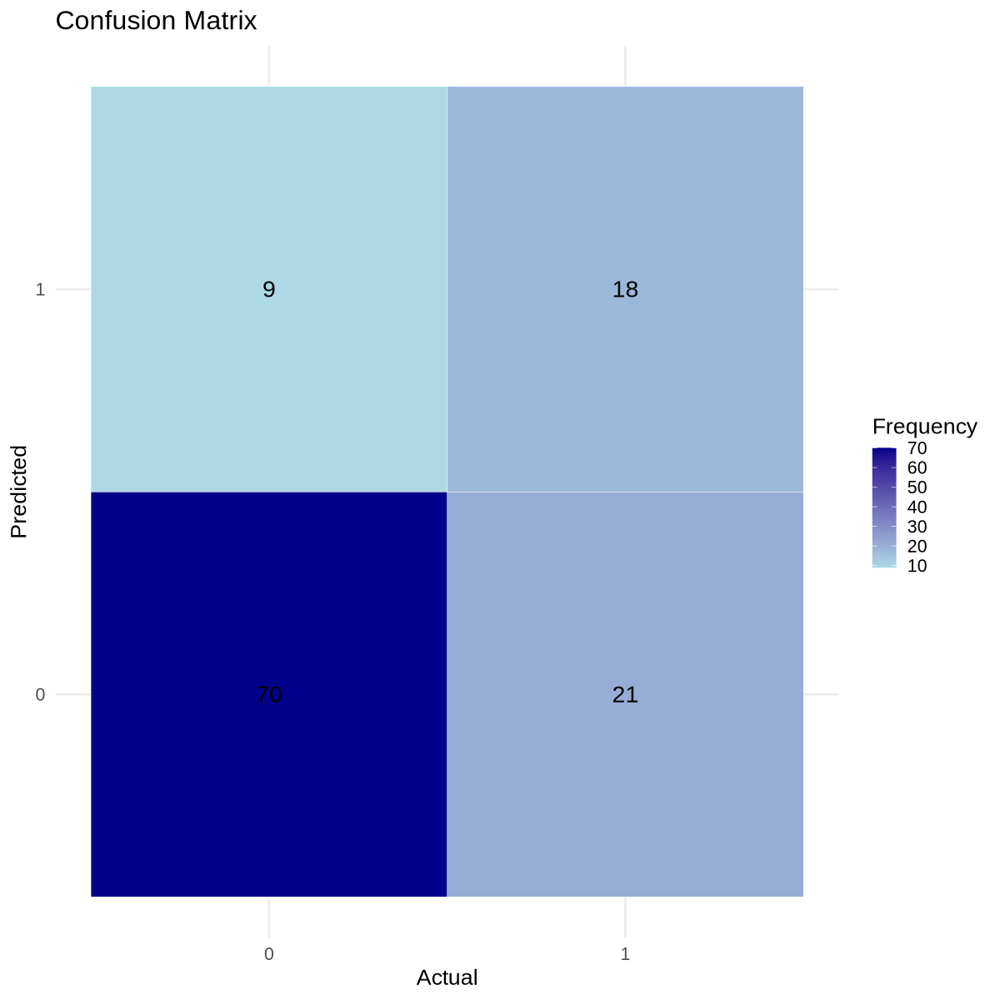

In [13]:
# Assesing accuracy
mean(fitted_values == testing_diabetes$Outcome)

#making the matrix
confusion_m <- confusionMatrix(
  factor(fitted_values, levels = c(0, 1)), 
  factor(testing_diabetes$Outcome, levels = c(0, 1))
)

# Extract confusion matrix as a table
confusion_m_table <- as.table(confusion_m$table)

# Convert to data frame for ggplot
confusion_m_df <- as.data.frame(confusion_m_table)
colnames(confusion_m_df) <- c("Predicted", "Actual", "Frequency")

# Create heatmap of confusion matrix
ggplot(confusion_m_df, aes(x = Actual, y = Predicted, fill = Frequency)) +
  geom_tile(color = "white") +
  geom_text(aes(label = Frequency), color = "black", size = 6) +
  scale_fill_gradient(low = "lightblue", high = "darkblue") +
  labs(title = "Confusion Matrix", x = "Actual", y = "Predicted") +
  theme_minimal(base_size = 16)

In [14]:
confusionMatrix(as.factor(fitted_values), as.factor(testing_diabetes$Outcome))

Confusion Matrix and Statistics

          Reference
Prediction  0  1
         0 70 21
         1  9 18
                                          
               Accuracy : 0.7458          
                 95% CI : (0.6574, 0.8214)
    No Information Rate : 0.6695          
    P-Value [Acc > NIR] : 0.04583         
                                          
                  Kappa : 0.377           
                                          
 Mcnemar's Test P-Value : 0.04461         
                                          
            Sensitivity : 0.8861          
            Specificity : 0.4615          
         Pos Pred Value : 0.7692          
         Neg Pred Value : 0.6667          
             Prevalence : 0.6695          
         Detection Rate : 0.5932          
   Detection Prevalence : 0.7712          
      Balanced Accuracy : 0.6738          
                                          
       'Positive' Class : 0               
                                    

From this Matrix, and the results, we see that we get a prediction accuracy of 83.39% and from the matrix we can see that the type 1 error is 12/(12+72+7+27), or 10% and the type 2 error is 7/(12+72+7+27), or 6%. Now, I will See if using lasso and backward selection can help improve this.

In [15]:
set.seed(1)
# Preparing data for glmnet
#model without interecpt
x_train <- model.matrix(Outcome ~ ., training_diabetes)[, -1]
y_train <- training_diabetes$Outcome

#model without interecpt
x_test <- model.matrix(Outcome ~ ., testing_diabetes)[, -1]
y_test <- testing_diabetes$Outcome

# Fit Lasso regression with cross-validation
lasso_model <- cv.glmnet(
  x_train, y_train, 
  alpha = 1, family = "binomial", 
  type.measure = "class"
)

# Getting best lambda
optimal_lambda <- lasso_model$lambda.min
print(paste("Optimal lambda:", optimal_lambda))

# Fitting the Lasso model with the best lambda
final_lasso_model <- glmnet(x_train, y_train, alpha = 1, lambda = optimal_lambda, family = "binomial")

# Predicting on the test set
lasso_preds <- predict(final_lasso_model, newx = x_test, type = "response")
lasso_fitted_values <- ifelse(lasso_preds > 0.5, 1, 0)

# Assessing accuracy
lasso_accuracy <- mean(lasso_fitted_values == y_test)
print(paste("Lasso Model Accuracy:", round(lasso_accuracy, 2)))

# Fitting the full model
full_model <- glm(Outcome ~ ., data = training_diabetes, family = binomial)

# Applying backward selection
backward_model <- step(full_model, direction = "backward")




# Extracting variables from the backward selection model
selected_variables <- names(coef(backward_model))[coef(backward_model) != 0]

# Converting to a data frame for visualization
selected_vars_df <- data.frame(Variable = selected_variables)
selected_vars_df




[1] "Optimal lambda: 0.0386142455377731"
[1] "Lasso Model Accuracy: 0.76"
Start:  AIC=244.16
Outcome ~ Pregnancies + Glucose + BloodPressure + SkinThickness + 
    Insulin + BMI + DiabetesPedigreeFunction + Age

                           Df Deviance    AIC
- BloodPressure             1   226.20 242.20
- Pregnancies               1   227.72 243.72
<none>                          226.16 244.16
- SkinThickness             1   228.17 244.17
- DiabetesPedigreeFunction  1   228.40 244.40
- Age                       1   228.47 244.47
- BMI                       1   230.16 246.16
- Insulin                   1   230.28 246.28
- Glucose                   1   277.42 293.42

Step:  AIC=242.2
Outcome ~ Pregnancies + Glucose + SkinThickness + Insulin + BMI + 
    DiabetesPedigreeFunction + Age

                           Df Deviance    AIC
- Pregnancies               1   227.74 241.74
<none>                          226.20 242.20
- SkinThickness             1   228.24 242.24
- DiabetesPedigreeFunct

Variable
<chr>
(Intercept)
Glucose
SkinThickness
Insulin
BMI
DiabetesPedigreeFunction
Age


Here, we see that the lasso accuracy in this case is slightly worse than the full regular model accuracy being 8%.

In [16]:
summary(backward_model)
#comparing backwards model 
back_sel_model <- glm(Outcome ~Glucose +BMI+DiabetesPedigreeFunction +Age,
                      data = training_diabetes)



# Assesing accuracy


# Predict on test data
predicted_vals <- predict(back_sel_model, newdata = testing_diabetes, type = "response")
# "rounding" predicted values to binary output
fitted__back_values <- ifelse(predicted_vals > 0.5, 1, 0)
mean(fitted__back_values == testing_diabetes$Outcome)


Call:
glm(formula = Outcome ~ Glucose + SkinThickness + Insulin + BMI + 
    DiabetesPedigreeFunction + Age, family = binomial, data = training_diabetes)

Coefficients:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)              -11.663940   1.488974  -7.834 4.74e-15 ***
Glucose                    0.047312   0.007523   6.289 3.20e-10 ***
SkinThickness              0.030405   0.021122   1.440   0.1500    
Insulin                   -0.003733   0.001787  -2.090   0.0367 *  
BMI                        0.066727   0.034481   1.935   0.0530 .  
DiabetesPedigreeFunction   0.723383   0.516760   1.400   0.1616    
Age                        0.059181   0.017652   3.353   0.0008 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 348.35  on 273  degrees of freedom
Residual deviance: 227.74  on 267  degrees of freedom
AIC: 241.74

Number of Fisher Scoring iterations: 5


[1] 0.779661

[1] "Backward Selection Model Accuracy: 0.78"


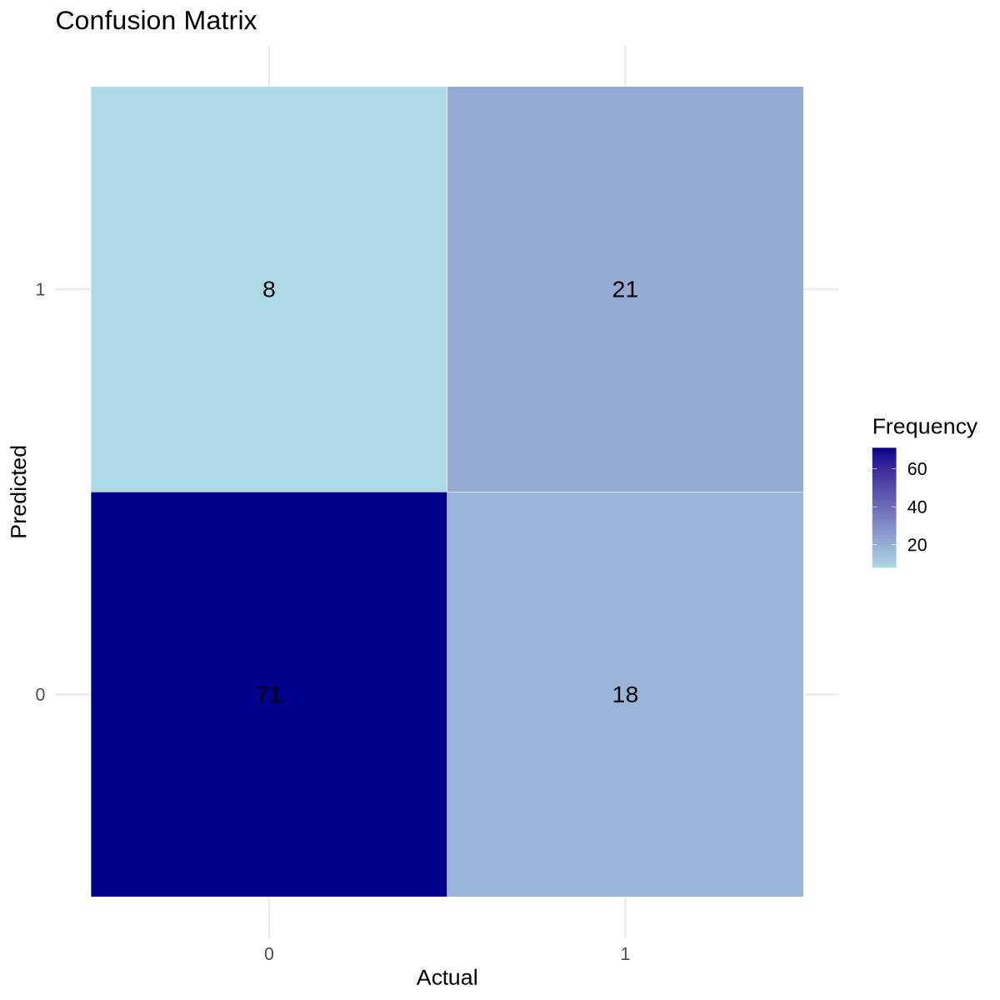

In [24]:

# Predicting on test data
backward_preds <- predict(backward_model, newdata = testing_diabetes, type = "response")


# Assessing accuracy
backward_accuracy <- mean(fitted__back_values == y_test)
print(paste("Backward Selection Model Accuracy:", round(backward_accuracy, 2)))


#making the matrix
confusion_m <- confusionMatrix(
  factor(fitted__back_values, levels = c(0, 1)), 
  factor(testing_diabetes$Outcome, levels = c(0, 1))
)


confusion_m_table <- as.table(confusion_m$table)


confusion_m_df <- as.data.frame(confusion_m_table)
colnames(confusion_m_df) <- c("Predicted", "Actual", "Frequency")

# Creating heatmap of confusion matrix
ggplot(confusion_m_df, aes(x = Actual, y = Predicted, fill = Frequency)) +
  geom_tile(color = "white") +
  geom_text(aes(label = Frequency), color = "black", size = 6) +
  scale_fill_gradient(low = "lightblue", high = "darkblue") +
  labs(title = "Confusion Matrix", x = "Actual", y = "Predicted") +
  theme_minimal(base_size = 16)

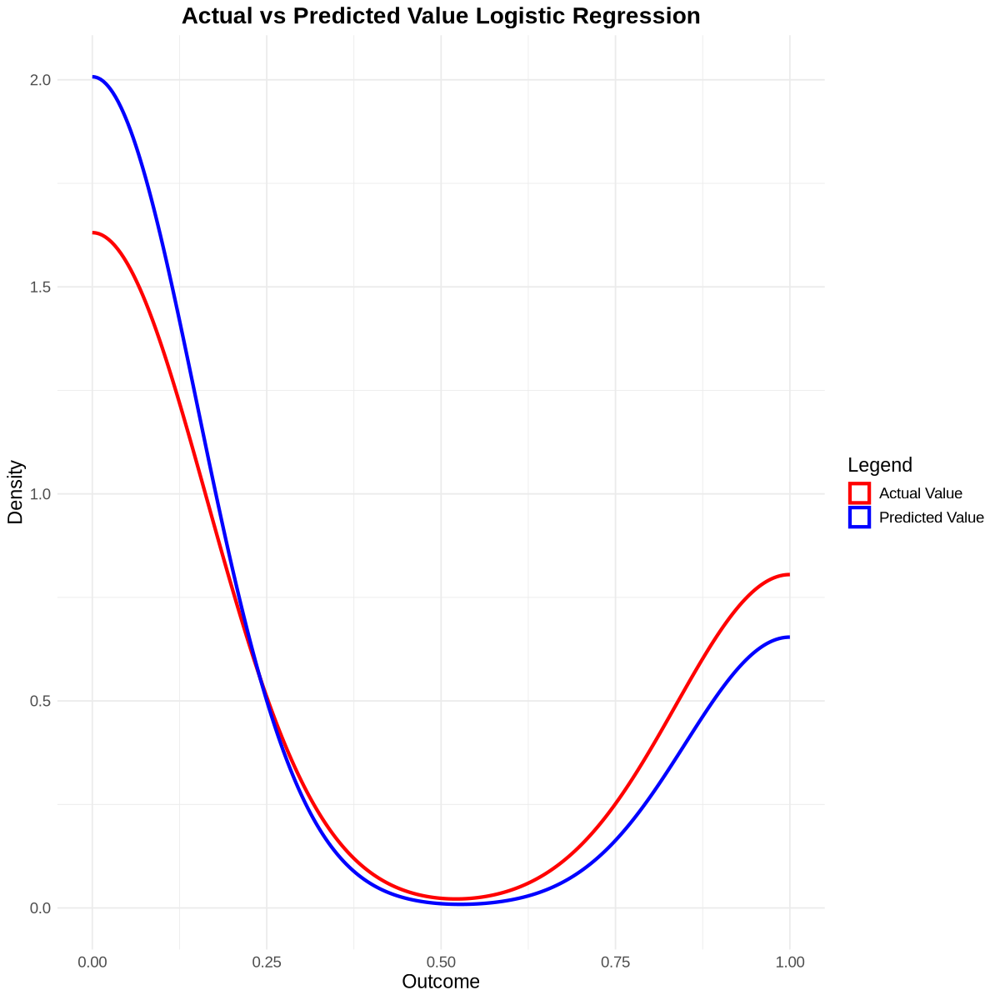

In [29]:
results <- data.frame(
  Actual = testing_diabetes$Outcome,
  Predicted = fitted__back_values
)
ggplot() +
  geom_density(data = results, aes(x = Actual, color = "Actual Value"), size = 1.2) +
  geom_density(data = results, aes(x = Predicted, color = "Predicted Value"), size = 1.2) +
  scale_color_manual(values = c("Actual Value" = "red", "Predicted Value" = "blue")) +
  labs(
    title = "Actual vs Predicted Value Logistic Regression",
    x = "Outcome",
    y = "Density",
    color = "Legend"
  ) +
  theme_minimal() +
  theme(
    text = element_text(size = 14),
    plot.title = element_text(face = "bold", hjust = 0.5)
  )

## Interpretation

From this, the backwards seletion algorithim  selected Glucose, BMI
Diabetes, PedigreeFunction, andAge to be the variables in the model, but the matrix given was somehow the worse as the full model, so in this paticular case, using lasso and backwards selection yeilded worse results than the full model, which was un expected. I suspect further analysis is required here to see how these methods are interacting with the variables, or it could just be a result of the data split. Overall, 84% accuracy from the full model is quite good, and looking at the type I and type II errors, they are proportionate to the Outcome distribution, so the predictor is not too biased.

## Extra ##
This is just extra and not part of the prediction plan, this is just a head stard on tryng to look at inference

In [ ]:
# #The full GLM model
# diabetes_glm <- glm(Outcome ~.,
#                     data = diabetes_data_clean,
#                     family = binomial
#     )


# best_model <- stepAIC(diabetes_glm, 
#                          direction = "both")
# summary(best_model)

# #model withouth intercepts
# x <- model.matrix(Outcome ~ ., diabetes_data_clean)[, -1]
# #prediction variable
# y <- diabetes_data_clean$Outcome

# #Using lasso
# cv_model <- cv.glmnet(x, y, family = "binomial", alpha = 1)
# best_lambda <- cv_model$lambda.min
# final_model <- glmnet(x, y, family = "binomial", alpha = 1, lambda = best_lambda)
# cv_result <- cv.glm(diabetes_data_clean, diabetes_glm, K = 10)
# cv_result$delta 
# summary(best_model)
# AIC(best_model)
# train_control <- trainControl(method = "cv", number = 10)
# model <- train(Outcome ~ ., data = diabetes_data_clean, method = "glm", trControl = train_control)
# model